## TP1

Alumno: Emmanuel Cardozo

### Parte 1

1. Implementar el algoritmo de pasaje a coordenadas cromáticas para librarnos de las variaciones de contraste.
2. Implementar el algoritmo White Patch para librarnos de las diferencias de color de iluminación.

### Parte 2

1. Para las imágenes img1_tp.png y img2_tp.png leerlas con OpenCV en escala de grisas y visualizarlas.
2. Elija el numero de bins que crea conveniente y grafique su histograma, compare los histogramas entre si. Explicar lo que se observa, si tuviera que entrenar un modelo de clasificación/detección de imágenes, considera que puede ser de utilidad tomar como ‘ features ’ a los histogramas?
3. Para la imagen segmentacion.png analice el histograma de los canales RGB. Segmente algunos de los elementos presentes en la imagen (agua, cielo, tierra) y muestre, aplicando mascaras, las regiones en imágenes separadas.

In [62]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

Prueba del método cv.imread()

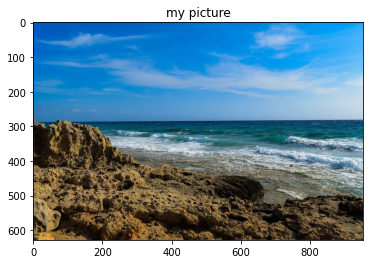

In [63]:
# Aclaracioón: El método cv.imread() da error en el caso de que el path enviado como string, tenga
# caracteres especiales (en mi caso, el @). Debí cambiar la ubicación de las imágenes de prueba

path = r'C:\Users\Emmanuel\Desktop\segmentacion.png' 
img = cv.imread(path)

plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('my picture')
plt.show()


### Parte 1

In [64]:
def load_image(path, filename, grayscale=False):
    flags = {"flags": cv.IMREAD_GRAYSCALE} if grayscale else {}
    img = cv.imread(os.path.join(path,filename))
    if grayscale:
       return img
    return cv.cvtColor(img, cv.COLOR_BGR2RGB)
#images_path = r'C:\Users\Emmanuel\Desktop\Universidad\@@Especialización en IA\Bimestre 3\Computer Vision\CEIA-Computer_Vision_1\TP1\assets\coord_cromaticas'
images_path = r'C:\Users\Emmanuel\Desktop\assets\coord_cromaticas'
pictures = ["CoordCrom_1.png", "CoordCrom_2.png", "CoordCrom_3.png"]
images =  [load_image(images_path, picture) for picture in pictures] 

In [65]:
def transform_chrom_coord(img):
    num = img.astype(np.float64)
    den = img.sum(axis=2, keepdims=True).astype(np.float64)
    transformed_img = np.divide(
        num,
        den,
        out=np.zeros_like(num),
        where=den != 0,
    )
    transformed_img *= 255 / transformed_img.max()  
    return transformed_img.astype(np.uint8)

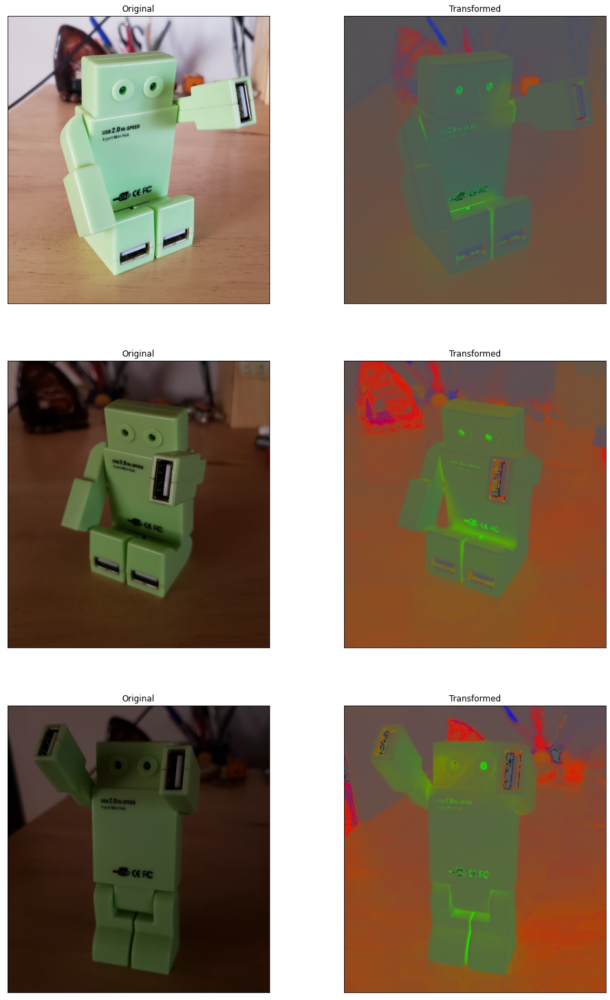

In [66]:
_, axes = plt.subplots(3, 2, figsize=(16, 26))
for i, image in enumerate(images):
    axes[i][0].imshow(image)
    axes[i][0].title.set_text("Original")
    axes[i][0].xaxis.set_visible(False)
    axes[i][0].yaxis.set_visible(False)
    axes[i][1].imshow(transform_chrom_coord(image))
    axes[i][1].title.set_text("Transformed")
    axes[i][1].xaxis.set_visible(False)
    axes[i][1].yaxis.set_visible(False)

In [67]:
images_path = r"C:\Users\Emmanuel\Desktop\assets\white_patch"

pictures = [
    "test_blue.png",
    "test_green.png",
    "test_red.png",
    "wp_blue.jpg",
    "wp_green.png",
    "wp_green3.jpg",
    "wp_no_white.png",
    "wp_red.png",
    "wp_red2.jpg",
]
images = [load_image(images_path, picture) for picture in pictures]

In [70]:
def white_patch(img, filename=None):
    transformed_img = img.astype(np.float32)
    rgb_max = transformed_img.reshape(-1, 3).max(axis=0)
    if np.all(rgb_max == 255):
        warnings.warn(
            f"{filename if filename else 'Image'} White Patch tiene un valor máximo de 255 por canal. Valor superado, el algoritmo no tiene efecto."
        )
    transformed_img *= 255 / rgb_max  
    transformed_img *= 255 / transformed_img.max() 
    return transformed_img.astype(np.uint8)


def plot_white_patch(img, filename=None, figsize=(18, 18)):
    _, axes = plt.subplots(1, 2, figsize=figsize)
    axes[0].imshow(img)
    axes[0].title.set_text("Original")
    axes[0].xaxis.set_visible(False)
    axes[0].yaxis.set_visible(False)
    axes[1].imshow(white_patch(img, filename))
    axes[1].title.set_text("Transformed")
    axes[1].xaxis.set_visible(False)
    axes[1].yaxis.set_visible(False)

C:\Users\Emmanuel\AppData\Local\Temp\ipykernel_17924\4134120772.py:5: UserWarning: wp_blue.jpg White Patch tiene un valor máximo de 255 por canal. Valor superado, el algoritmo no tiene efecto.
  warnings.warn(


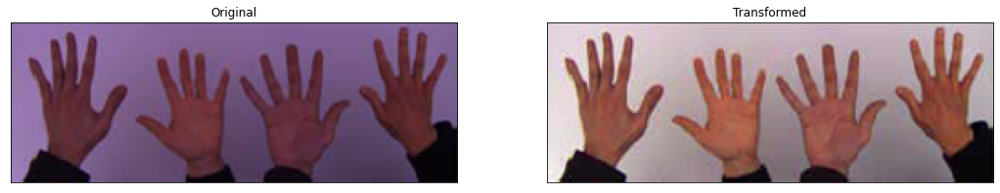

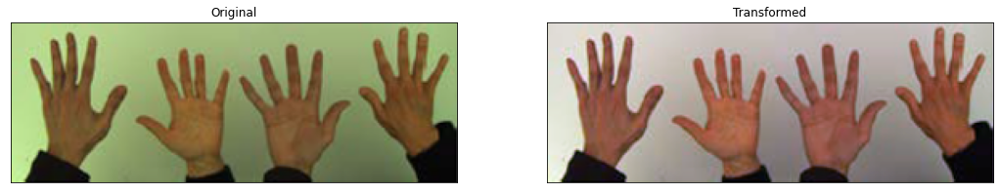

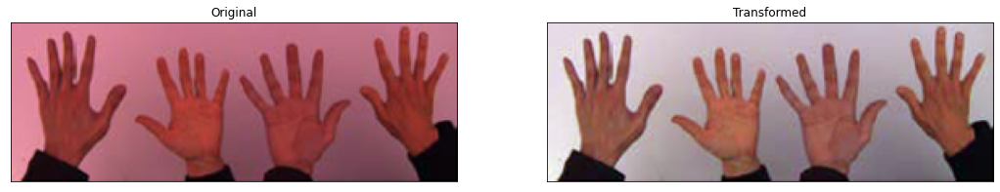

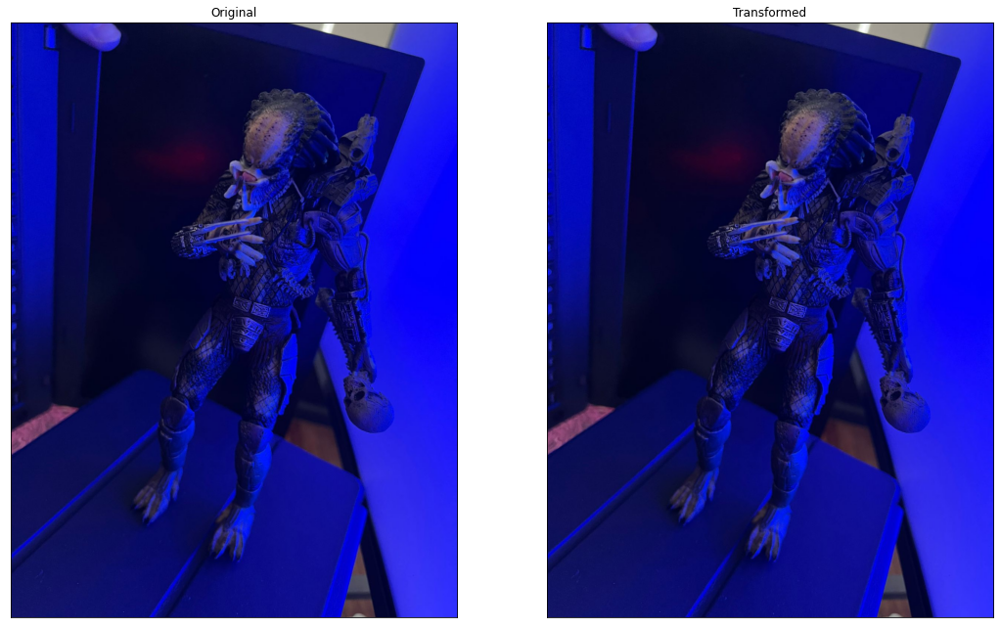

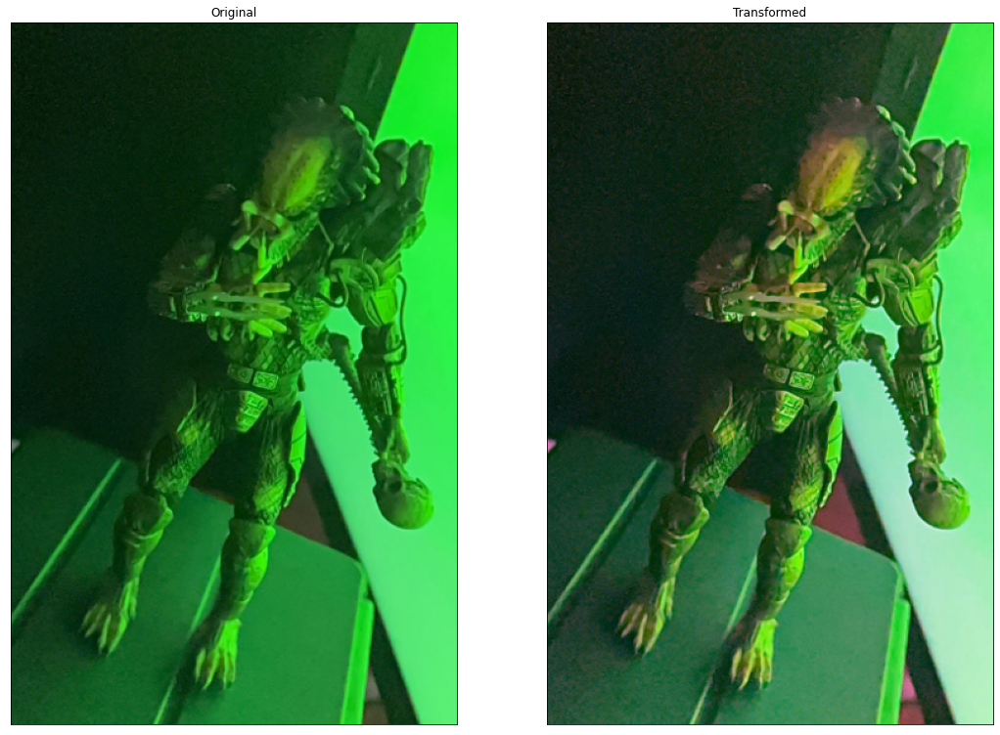

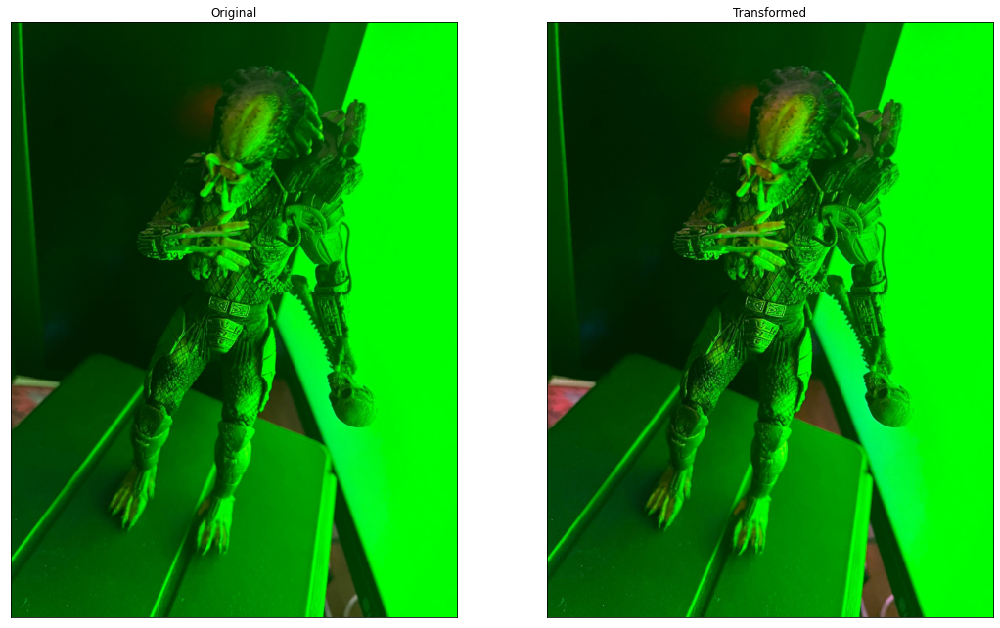

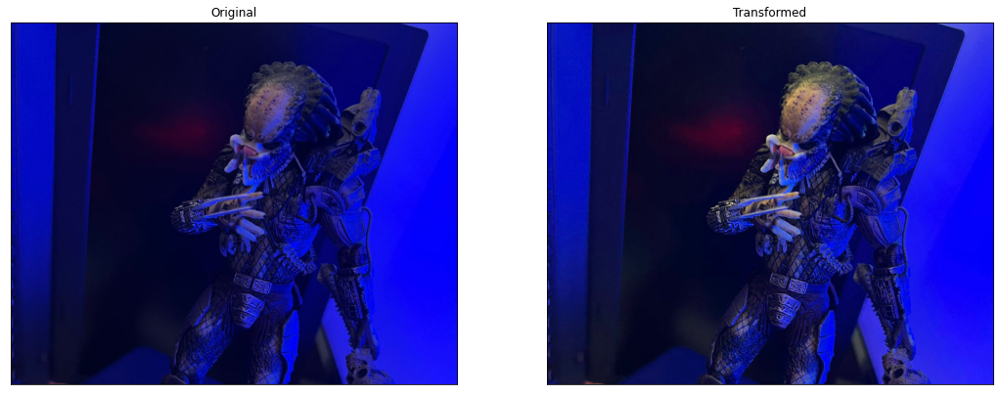

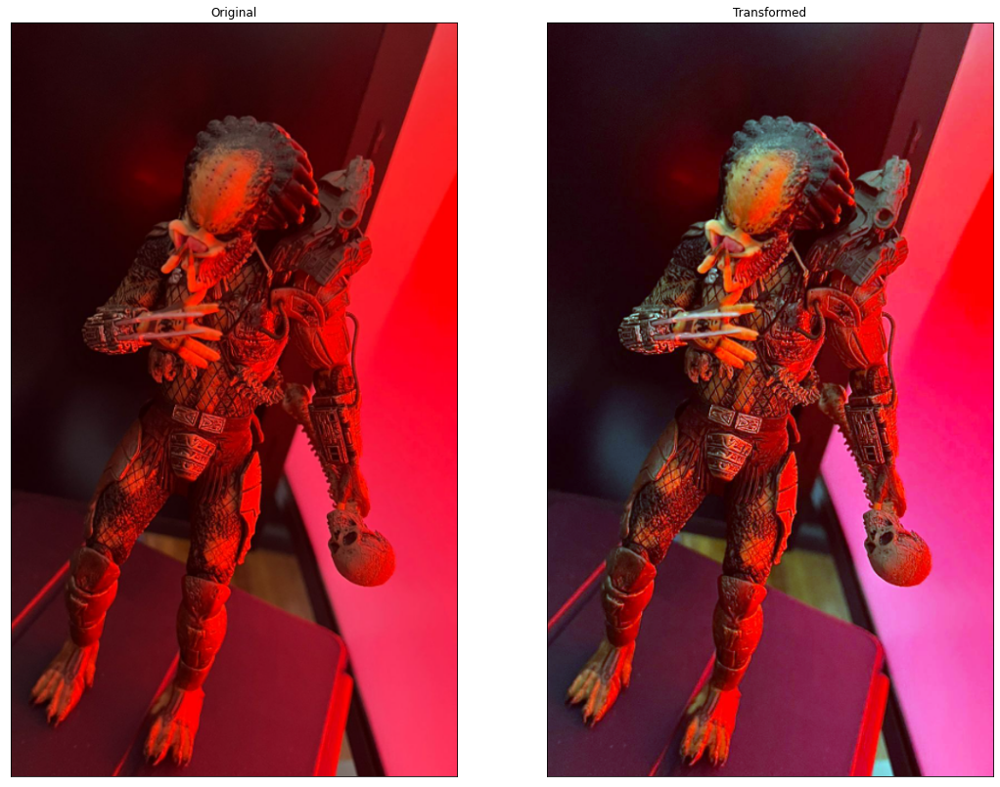

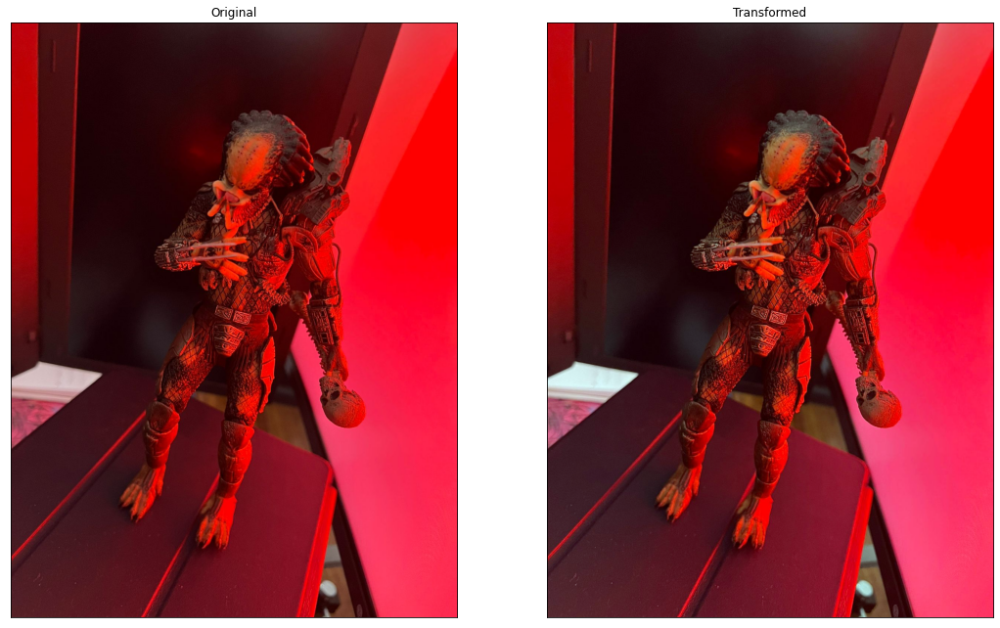

In [71]:
for filename, img in zip(filenames, images):
    plot_white_patch(img, filename, (18, 18))

### Parte 2:


In [100]:
images_path = r"C:\Users\Emmanuel\Desktop\assets"

img1 = load_image(images_path, "img1_tp.png", grayscale=True)
img2 = load_image(images_path, "img2_tp.png", grayscale=True)

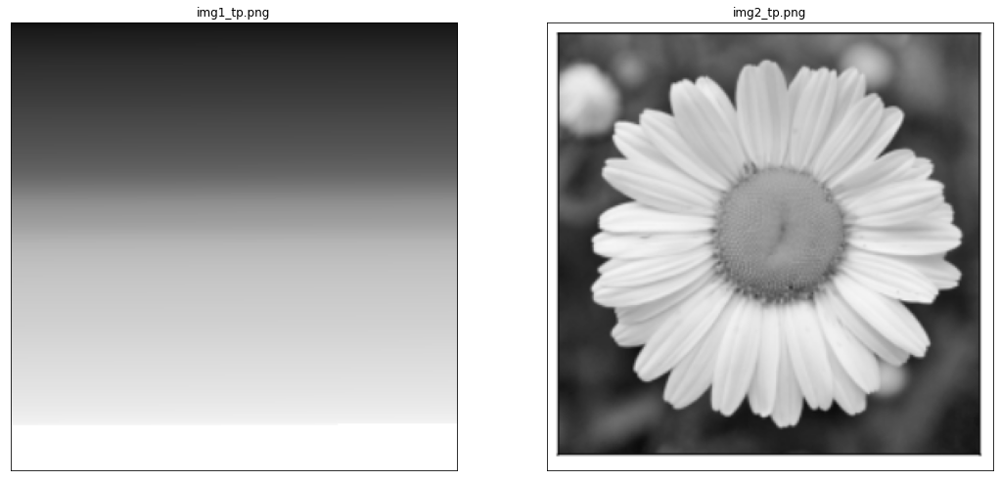

In [101]:
_, axes = plt.subplots(1, 2, figsize=(18, 18))

axes[0].imshow(img1, cmap="gray")
axes[0].title.set_text("img1_tp.png")
axes[0].xaxis.set_visible(False)
axes[0].yaxis.set_visible(False)

axes[1].imshow(img2, cmap="gray")
axes[1].title.set_text("img2_tp.png")
axes[1].xaxis.set_visible(False)
axes[1].yaxis.set_visible(False)

Las imágenes en escala de grises utiliza 8 bits, es decir, puede tomar 256 valores posibles. Es por ello que vamos a utilizar 256 bins (de 0 a 255) para realizar el histograma de ambas imágenes. Ploteamos utilizando Matplotlib:

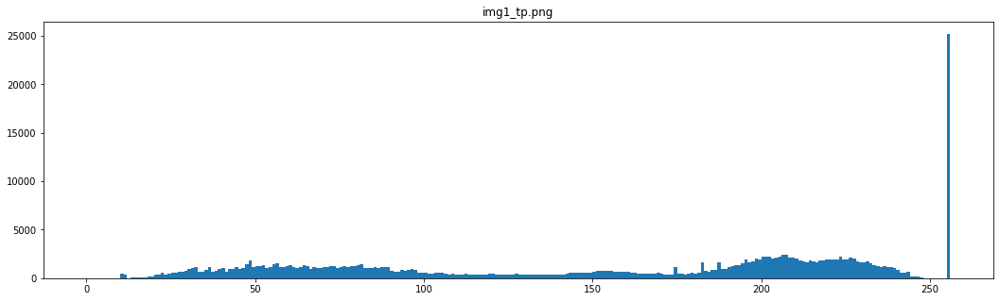

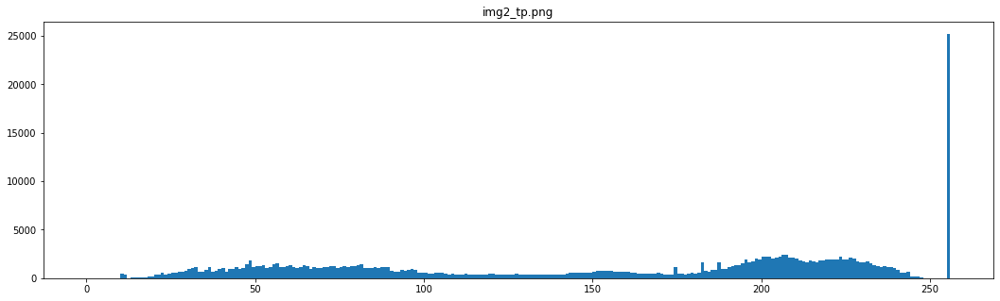

In [102]:
plt.figure(figsize=(18, 5))
plt.title("img1_tp.png")
plt.hist(img1.ravel(),256,[0,256]);  plt.show()

plt.figure(figsize=(18, 5))
plt.title("img2_tp.png")
plt.hist(img2.ravel(),256,[0,256]); plt.show()

In [112]:
# Ordeno los elementos de los Numpy Arrays "aplanados" que devuelven img1.ravel() e img2.ravel(), para poder compararlos: 
img1_ord = np.sort(img1.ravel())
img2_ord = np.sort(img2.ravel())

In [113]:
np.allclose(img1_ord, img2_ord, equal_nan=False)

True

Los histogramas son idénticos, como parecía indicar a simple viste sus gráficas.

-Si tuviera que entrenar un modelo de clasificación/detección de imágenes, considera que puede ser de utilidad tomar como ‘ features ’ a los histogramas?

-La respuesta sería: No necesariamente. Un histograma sólo brinda información acerca de la distribución de intensidad de los píxeles, pero no de la distribución espacial. Ésto se puede ver justamente con las 2 imágenes de ejemplo cuyos histogramas ploteamos anteriormente: sus distribuciones son idénticas pero las imágenes en absoluto. No hay una idea de contorno o de distribución de objetos en los histogramas, por lo que no recomendaría tomarlos como 'features' para entrenar un modelo de clasificación/detección.

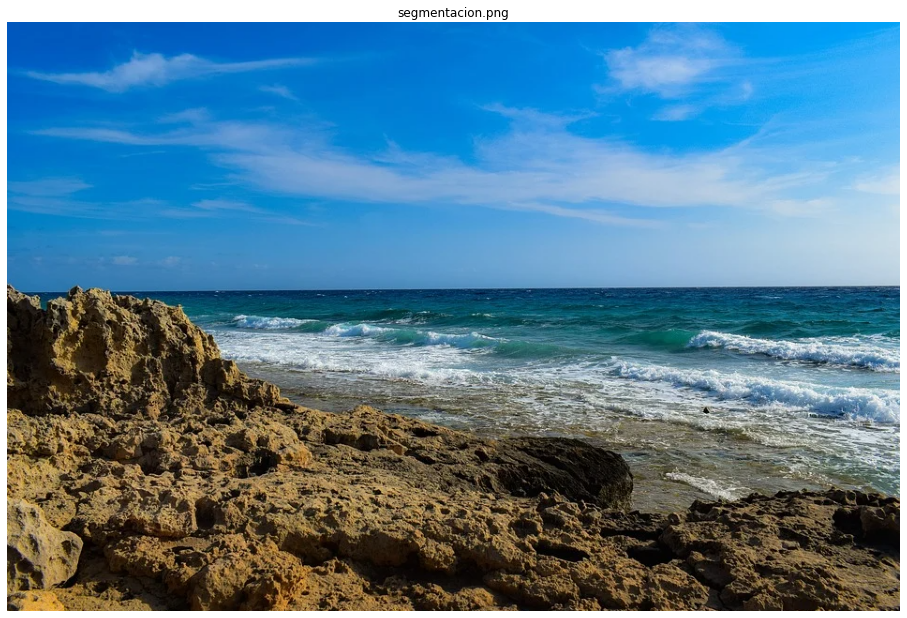

In [115]:
img = load_image(images_path, "segmentacion.png")

plt.figure(figsize=(16, 16))
plt.imshow(img)
plt.axis("off")
plt.title("segmentacion.png")
plt.show()

In [123]:
default_config = {
    "all_chn": {"title": "All channels"},
    "chn_1": {"title": "Channel 1", "color": "r"},
    "chn_2": {"title": "Channel 2", "color": "g"},
    "chn_3": {"title": "Channel 3", "color": "b"},
}


def plot_channels(img, config=default_config, figsize=(15, 10)):
    chn_1, chn_2, chn_3 = cv.split(img)  # Divido la imagen en sus 3 canales R, G y B.
    chn_1_hist, _ = np.histogram(chn_1.ravel(), 256, [0, 255])
    chn_2_hist, _ = np.histogram(chn_2.ravel(), 256, [0, 255])
    chn_3_hist, _ = np.histogram(chn_3.ravel(), 256, [0, 255])

    f, axes = plt.subplots(
        4, 1, sharex=True, figsize=figsize, gridspec_kw={"height_ratios": [3, 1, 1, 1]}
    )

    axes[0].plot(chn_1_hist, color=config["chn_1"]["color"])
    axes[0].plot(chn_2_hist, color=config["chn_2"]["color"])
    axes[0].plot(chn_3_hist, color=config["chn_3"]["color"])
    axes[0].title.set_text(config["all_chn"]["title"])
    axes[0].set_xlim([0, 255])

    axes[1].plot(chn_1_hist, color=config["chn_1"]["color"])
    axes[1].title.set_text(config["chn_1"]["title"])
    axes[1].set_xlim([0, 255])

    axes[2].plot(chn_2_hist, color=config["chn_2"]["color"])
    axes[2].title.set_text(config["chn_2"]["title"])
    axes[2].set_xlim([0, 255])

    axes[3].plot(chn_3_hist, color=config["chn_3"]["color"])
    axes[3].title.set_text(config["chn_3"]["title"])
    axes[3].set_xlim([0, 255])

    f.tight_layout()

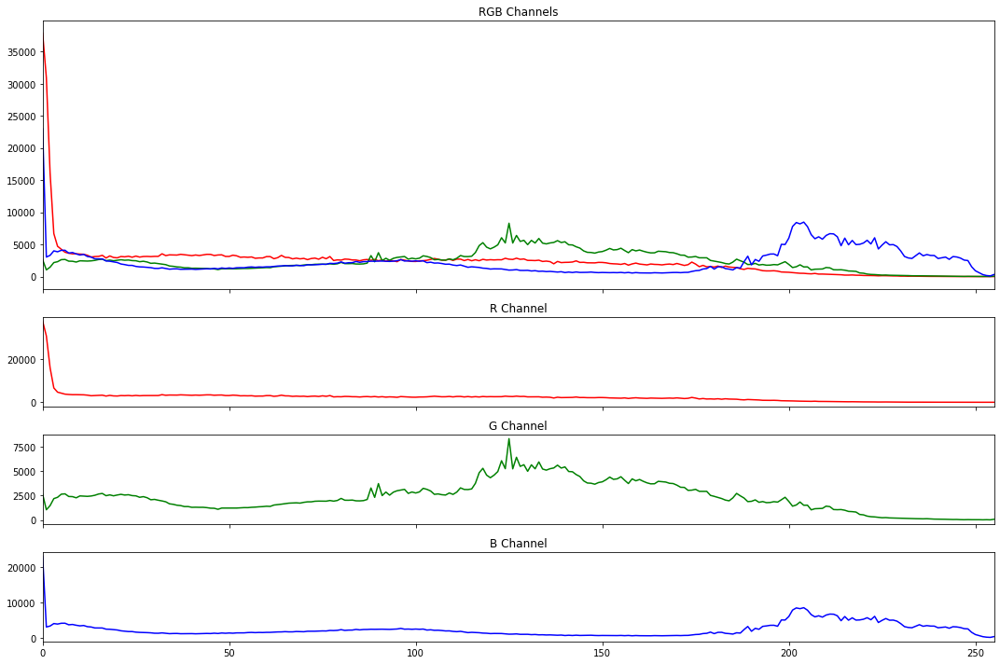

In [124]:
plot_channels(
    img,
    {
        "all_chn": {"title": "RGB Channels"},
        "chn_1": {"title": "R Channel", "color": "r"},
        "chn_2": {"title": "G Channel", "color": "g"},
        "chn_3": {"title": "B Channel", "color": "b"},
    },
)

In [145]:
def segment_image(img, lower_bound, upper_bound, figsize=(18, 18), format=None):
    mask = cv.inRange(img, np.array(lower_bound), np.array(upper_bound))
    segmented_img = cv.bitwise_and(img, img, mask=mask)
    if format:
        segmented_img = cv.cvtColor(segmented_img, format)

    _, axes = plt.subplots(1, 2, figsize=figsize)

    axes[0].imshow(segmented_img)
    axes[0].title.set_text("Segmented Image")
    axes[0].xaxis.set_visible(False)
    axes[0].yaxis.set_visible(False)

    axes[1].imshow(mask, cmap="gray")
    axes[1].title.set_text("Mask")
    axes[1].xaxis.set_visible(False)
    axes[1].yaxis.set_visible(False)

#### Segmentado agua

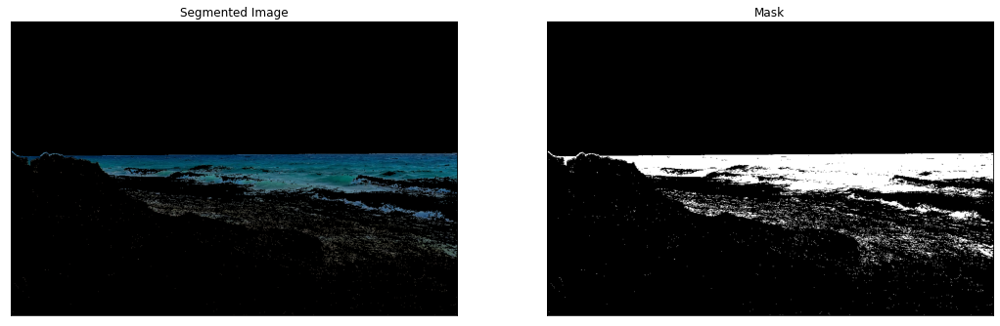

In [202]:
segment_image(img, lower_bound=[0, 0, 70], upper_bound=[100, 140, 160])

#### Segmentado cielo

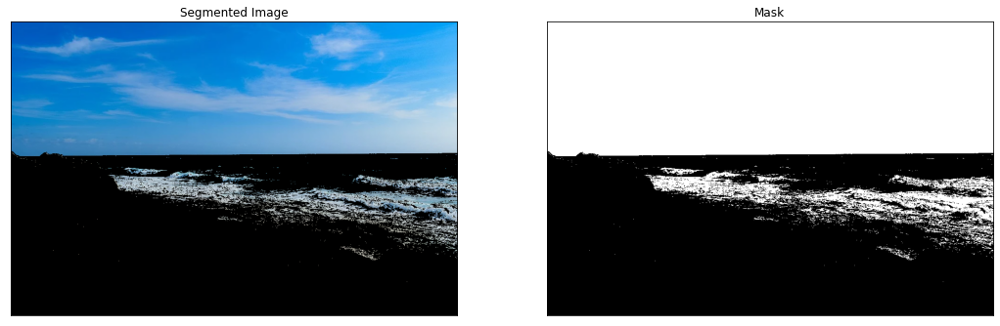

In [217]:
segment_image(img, lower_bound=[0, 60, 160], upper_bound=[210, 255, 255])

#### Segmentado tierra

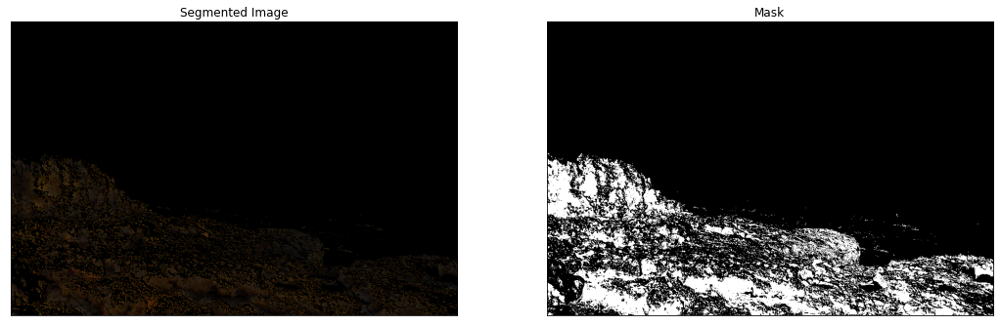

In [266]:
segment_image(img, lower_bound=[10, 0, 0], upper_bound=[150, 180, 30])

Segmentado con modelo de color HSV

In [268]:
image_hsv = cv.cvtColor(img, cv.COLOR_RGB2HSV)

#### Segmentado agua

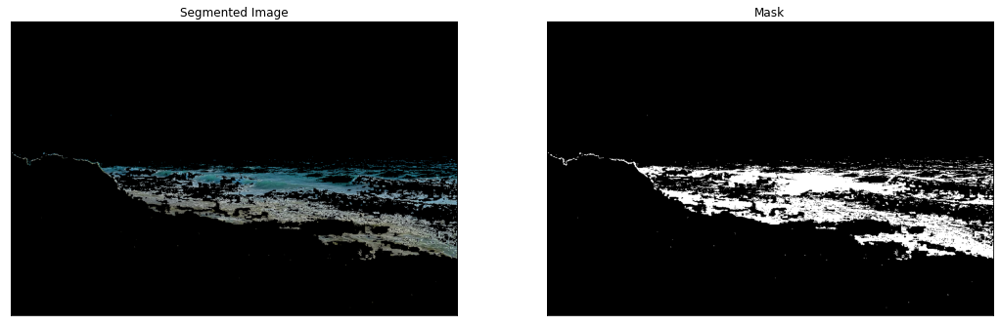

In [312]:
segment_image(
    image_hsv,
    lower_bound=[30, 0, 60],
    upper_bound=[100, 210, 200],
    format=cv.COLOR_HSV2RGB,
)

#### Segmentado cielo

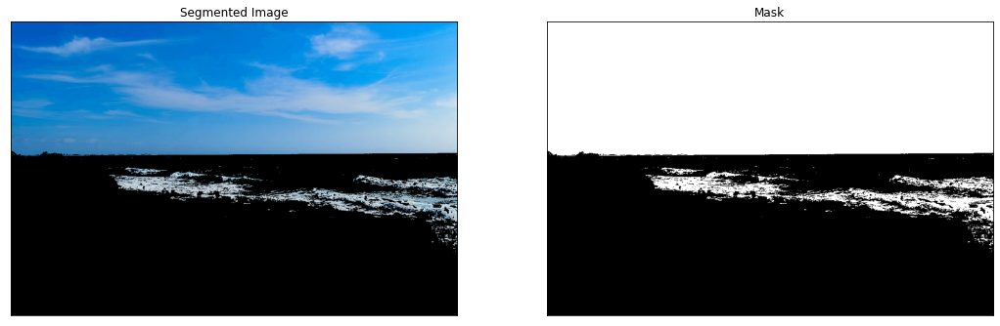

In [328]:

segment_image(
    image_hsv,
    lower_bound=[90, 20, 170],
    upper_bound=[255, 255, 255],
    format=cv.COLOR_HSV2RGB,
)

#### Segmentado tierra

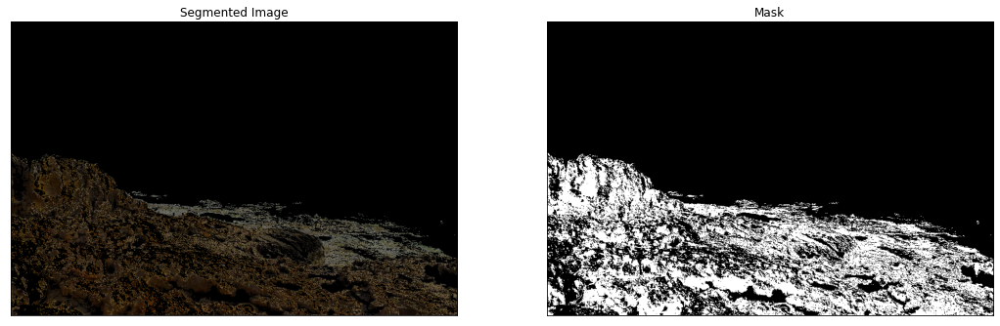

In [369]:
segment_image(
    image_hsv,
    lower_bound=[0, 0, 20],
    upper_bound=[55, 255, 120],
    format=cv.COLOR_HSV2RGB,
)